# CBED Exit Wave Comparison: Gold [110] (Heavy Atom)

Five propagation algorithms compared on Au [110] zone axis (200 keV)
with frozen phonon averaging to produce CBED patterns:
**Fresnel MS**, **Angular Spectrum MS**, **WPM**, **KG ODE**, **KG FWD Lanczos**.

Gold's strong scattering potential should produce visible differences
between the paraxial (Fresnel/AS) and non-parabolic (KG) methods.

In [19]:
%matplotlib widget

import os
from time import perf_counter
import functools

os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = ".1"

import abtem
import cupy
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
from ase.build import bulk, surface
from matplotlib.colors import LogNorm
from tqdm.auto import tqdm

from wide_angle_propagation.wpm import (
    electron_refractive_index,
    energy2wavelength,
    fresnel_propagation_kernel,
    angular_spectrum_propagation_kernel,
    simulate_fresnel_as,
    simulate_wpm,
    simulate_kg_ode_full,
)
from wide_angle_propagation.klein_gordon import _lanczos_expsqrt

abtem.config.set({"device": "gpu"})
abtem.config.set({"precision": "float64"})
jax.config.update("jax_enable_x64", True)

## Crystal, probe, and potential

Au [110] zone axis, orthogonalised cell with CBED probe at 6.2 mrad.
Frozen phonon averaging with $\sigma_\mathrm{Au} = 0.065$ Å.

In [20]:
# --- Parameters ---
energy = 200e3              # 200 keV
a_Au = 4.076                # lattice parameter (Å)
n_fp = 1                    # frozen phonon configurations
sigma_Au = 0.065            # RMS thermal displacement (Å)
semiangle_mrad = 6.2        # CBED convergence semi-angle (mrad)
slice_dz = 2.0              # slice thickness (Å)

# --- Build Au [110] orthogonal cell ---
au_bulk = bulk("Au", "fcc", a=a_Au)
au_110 = surface(au_bulk, (1, 1, 0), layers=2)
unit_cell = abtem.orthogonalize_cell(au_110)

# Fix z-periodicity to match [110] repeat
z_period = a_Au / np.sqrt(2)
unit_cell.cell[2, 2] = z_period
unit_cell.pbc = [True, True, True]

# Target ~40 Å lateral, ~400 Å thick
nx = int(np.ceil(40 / unit_cell.cell.lengths()[0]))
ny = int(np.ceil(40 / unit_cell.cell.lengths()[1]))
nz = int(np.ceil(400 / z_period))

supercell = unit_cell * (nx, ny, nz)
total_thickness = float(supercell.cell[2, 2])
n_total_slices = int(np.round(total_thickness / slice_dz))

# --- Reference potential (undisplaced) ---
potential_ref = abtem.Potential(
    supercell, sampling=0.1, slice_thickness=slice_dz,
    projection="finite", parametrization="lobato",
)
gpts = tuple(potential_ref.gpts)

# --- CBED probe ---
probe = abtem.Probe(energy=energy, semiangle_cutoff=semiangle_mrad)
probe.grid.match(potential_ref)
probe_array = jnp.array(cupy.asnumpy(probe.build(lazy=False).array))
sampling = (float(probe.grid.sampling[0]), float(probe.grid.sampling[1]))

# --- Propagation kernels ---
fk = jnp.array(fresnel_propagation_kernel(*gpts, sampling, z=slice_dz, energy=energy))
ak = jnp.array(angular_spectrum_propagation_kernel(*gpts, sampling, z=slice_dz, energy=energy))

# --- Pre-build reference potential on JAX & free GPU memory for FP loop ---
pot_ref = jnp.array(cupy.asnumpy(potential_ref.build(lazy=False).array / slice_dz))
del potential_ref
cupy.get_default_memory_pool().free_all_blocks()

wavelength = energy2wavelength(energy)
lx, ly, lz = supercell.cell.lengths()
print(f"Crystal: Au [110] (orthogonalised)")
print(f"Supercell: {nx}×{ny}×{nz}, {len(supercell)} atoms")
print(f"Cell: {lx:.1f} × {ly:.1f} × {lz:.1f} Å")
print(f"Energy: {energy/1e3:.0f} keV, λ = {wavelength:.4f} Å")
print(f"Grid: {gpts}, sampling = ({sampling[0]:.4f}, {sampling[1]:.4f}) Å")
print(f"Slices: {n_total_slices}, dz = {slice_dz:.2f} Å")
print(f"Total thickness: {total_thickness:.1f} Å")
print(f"CBED probe: {semiangle_mrad} mrad semi-angle")
print(f"Frozen phonons: {n_fp} configs, σ = {sigma_Au} Å")

Crystal: Au [110] (orthogonalised)
Supercell: 14×14×139, 54488 atoms
Cell: 40.4 × 40.4 × 400.8 Å
Energy: 200 keV, λ = 0.0251 Å
Grid: (404, 404), sampling = (0.0999, 0.0999) Å
Slices: 200, dz = 2.00 Å
Total thickness: 400.8 Å
CBED probe: 6.2 mrad semi-angle
Frozen phonons: 1 configs, σ = 0.065 Å


## KG Forward Lanczos propagator

Applies $\exp(i \, dz \, \sqrt{M})$ per slice via FFT-based matvec + Lanczos
iteration.  Scans through the **full** potential stack (all slices) in one call.

In [21]:
def simulate_kg_fwd_lanczos(pot_arr, psi_0, dz, E, samp, lanczos_m=130):
    """Propagate through full potential stack via KG FWD Lanczos (all beams).

    Uses a jitted per-slice loop instead of lax.scan to avoid tracing
    the full slice stack at compile time.
    """
    ny, nx = psi_0.shape
    k0_sq = (2 * jnp.pi / energy2wavelength(E)) ** 2

    dy, dx = samp
    fy = jnp.fft.fftfreq(ny, d=dy)
    fx = jnp.fft.fftfreq(nx, d=dx)
    Fx, Fy = jnp.meshgrid(fx, fy)
    kp_sq = (2 * jnp.pi * Fy) ** 2 + (2 * jnp.pi * Fx) ** 2

    n_sq_all = jax.vmap(lambda V: electron_refractive_index(V, E) ** 2)(pot_arr)

    probe_k = jnp.fft.fft2(jnp.asarray(psi_0, dtype=jnp.complex128)) / (ny * nx)
    state = probe_k.ravel()

    @functools.partial(jax.jit, static_argnums=(4, 5, 6))
    def _propagate_one_slice(s, n_sq, k0sq, kpsq, ny_, nx_, m_):
        def matvec(v):
            vg = v.reshape(ny_, nx_)
            conv = jnp.fft.fft2(n_sq * jnp.fft.ifft2(vg))
            return (k0sq * conv - kpsq * vg).ravel()
        return _lanczos_expsqrt(matvec, s, dz, m_)

    for i in range(pot_arr.shape[0]):
        state = _propagate_one_slice(state, n_sq_all[i], k0_sq, kp_sq, ny, nx, lanczos_m)

    exit_k = state.reshape(ny, nx)
    exit_wave = jnp.fft.ifft2(exit_k) * (ny * nx)
    return np.asarray(exit_wave)

print("Lanczos propagator defined.")

Lanczos propagator defined.


In [22]:
# --- Frozen phonon propagation ---
method_names = ["Fresnel MS", "Angular Spectrum", "WPM", "KG ODE", "KG FWD Lanczos"]
dp_avg = {name: np.zeros(gpts) for name in method_names}
exit_waves = {}

rng = np.random.default_rng(42)

for fp_idx in tqdm(range(n_fp), desc="Frozen phonon configs"):
    # Displace atoms thermally
    displaced = supercell.copy()
    displaced.positions += rng.normal(0, sigma_Au, displaced.positions.shape)
    displaced.wrap()
    displaced.info["thermal_sigma"] = 0.0
    displaced.arrays["thermal_sigma"] = np.zeros(len(displaced))

    # Build potential for this configuration
    pot_fp = abtem.Potential(
        displaced, gpts=gpts, slice_thickness=slice_dz,
        projection="finite", parametrization="lobato",
    )
    pot_arr = jnp.array(cupy.asnumpy(pot_fp.build(lazy=False).array / slice_dz))
    del pot_fp
    cupy.get_default_memory_pool().free_all_blocks()

    # Run 5 methods
    ew_f, _, _ = simulate_fresnel_as(pot_arr, probe_array, fk, slice_dz, energy)
    ew_a, _, _ = simulate_fresnel_as(pot_arr, probe_array, ak, slice_dz, energy)
    ew_w, _, _ = simulate_wpm(pot_arr, probe_array, slice_dz, energy, sampling)
    ew_o, _, _, _ = simulate_kg_ode_full(pot_arr, probe_array, slice_dz, energy, sampling,
                                          rtol=1e-9, atol=1e-11)
    ew_l = simulate_kg_fwd_lanczos(pot_arr, probe_array, slice_dz, energy, sampling)

    # Accumulate |DP|²
    for name, ew in zip(method_names, [ew_f, ew_a, ew_w, ew_o, ew_l]):
        dp_i = np.abs(np.fft.fftshift(np.fft.fft2(np.asarray(ew)))) ** 2
        dp_avg[name] += dp_i / n_fp

    # Keep last configuration exit waves for later comparison
    if fp_idx == n_fp - 1:
        exit_waves = dict(zip(
            method_names,
            [np.asarray(e) for e in [ew_f, ew_a, ew_w, ew_o, ew_l]],
        ))

    del pot_arr
    print(f"  Config {fp_idx + 1}/{n_fp} done.")

print(f"\nFrozen phonon averaging complete ({n_fp} configs × {len(method_names)} methods).")

Frozen phonon configs:   0%|          | 0/1 [00:00<?, ?it/s]

  Config 1/1 done.

Frozen phonon averaging complete (1 configs × 5 methods).


In [23]:
# Quick summary
for name in method_names:
    ew = exit_waves[name]
    dp = dp_avg[name]
    print(f"{name:22s}  |exit| range [{np.abs(ew).min():.6f}, {np.abs(ew).max():.6f}]"
          f"   DP max {dp.max():.4e}")

Fresnel MS              |exit| range [0.000000, 0.000071]   DP max 7.9629e-04
Angular Spectrum        |exit| range [0.000000, 0.000070]   DP max 8.2503e-04
WPM                     |exit| range [0.000000, 0.000104]   DP max 8.2377e-04
KG ODE                  |exit| range [0.000000, 0.000103]   DP max 9.5787e-04
KG FWD Lanczos          |exit| range [0.000000, 0.000103]   DP max 9.5786e-04


## CBED patterns (frozen phonon averaged)

Diffraction intensities averaged over all frozen phonon configurations.
Displayed on a log scale.

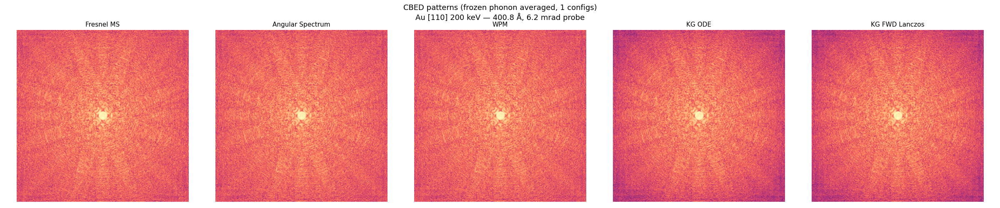

In [24]:
fig, axes = plt.subplots(1, 5, figsize=(24, 5))

for j, name in enumerate(method_names):
    dp = dp_avg[name]
    dp_n = dp / dp.max() if dp.max() > 0 else dp
    axes[j].imshow(dp_n, norm=LogNorm(vmin=1e-8, vmax=1), cmap="magma", origin="lower")
    axes[j].set_title(name, fontsize=11)
    axes[j].axis("off")

fig.suptitle(
    f"CBED patterns (frozen phonon averaged, {n_fp} configs)\n"
    f"Au [110] {energy/1e3:.0f} keV — {total_thickness:.1f} Å, {semiangle_mrad} mrad probe",
    fontsize=13,
)
plt.tight_layout()
plt.show()

## Exit wave comparison (last frozen phonon configuration)

Top row: amplitude.  Bottom row: phase.  All methods on shared colour scales.

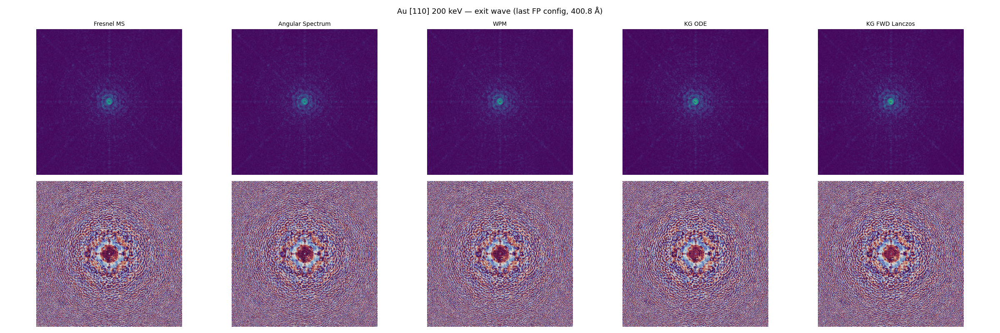

In [25]:
fig, axes = plt.subplots(2, 5, figsize=(24, 8))

all_amps = [np.abs(exit_waves[n]) for n in method_names]
vmin_a = min(a.min() for a in all_amps)
vmax_a = max(a.max() for a in all_amps)

for j, name in enumerate(method_names):
    ew = exit_waves[name]
    im_a = axes[0, j].imshow(np.abs(ew), cmap="viridis", vmin=vmin_a, vmax=vmax_a, origin="lower")
    axes[0, j].set_title(name, fontsize=10)
    axes[0, j].axis("off")

    im_p = axes[1, j].imshow(np.angle(ew), cmap="twilight", vmin=-np.pi, vmax=np.pi, origin="lower")
    axes[1, j].axis("off")

axes[0, 0].set_ylabel("Amplitude", fontsize=12)
axes[1, 0].set_ylabel("Phase", fontsize=12)

fig.suptitle(f"Au [110] {energy/1e3:.0f} keV — exit wave (last FP config, {total_thickness:.1f} Å)", fontsize=13)
plt.tight_layout()
plt.show()

## Error analysis

All differences computed relative to KG ODE.

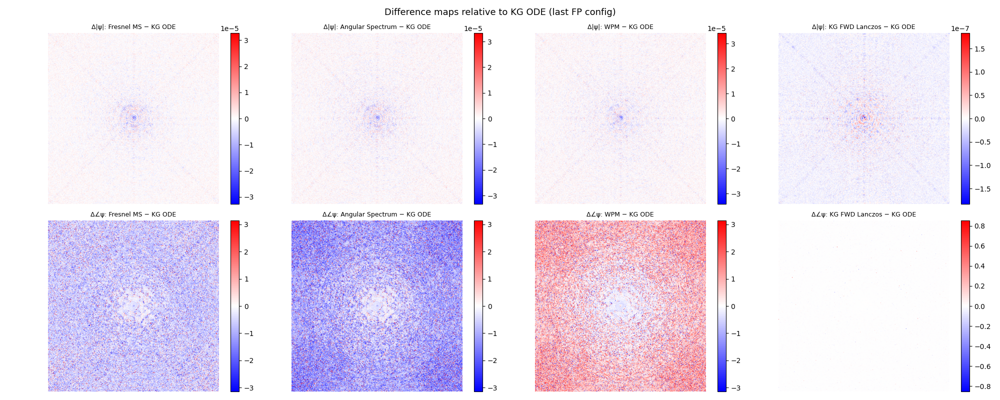


Method                        Amp RMSE   Phase RMSE (rad)       Rel L2
-----------------------------------------------------------------------
Fresnel MS                    0.000002           0.922289 6.607353e-01
Angular Spectrum              0.000002           1.321941 9.096773e-01
WPM                           0.000002           1.106118 6.972539e-01
KG FWD Lanczos                0.000000           0.009021 3.499069e-03


: 

In [ ]:
# --- CBED pattern comparison relative to KG ODE ---ref_name = "KG ODE"ref_dp = dp_avg[ref_name]compare_methods = {k: v for k, v in dp_avg.items() if k != ref_name}n_comp = len(compare_methods)fig, axes = plt.subplots(1, n_comp, figsize=(6 * n_comp, 5))if n_comp == 1:    axes = np.array([axes])for j, (name, dp) in enumerate(compare_methods.items()):    dp_diff = dp - ref_dp    vabs = np.max(np.abs(dp_diff)) or 1e-10    im = axes[j].imshow(dp_diff, cmap="bwr", vmin=-vabs, vmax=vabs, origin="lower")    axes[j].set_title(f"Δ|DP|²: {name} − {ref_name}", fontsize=10)    axes[j].axis("off")    fig.colorbar(im, ax=axes[j], fraction=0.046)fig.suptitle("CBED pattern differences relative to KG ODE (frozen phonon averaged)", fontsize=13)plt.tight_layout()plt.show()# Print RMSE/error summary for CBED patternsprint(f"\n{'Method':<25s} {'RMS Diff':>15s} {'Max Diff':>15s} {'Rel L2':>15s}")print("-" * 70)for name, dp in compare_methods.items():    dp_diff = dp - ref_dp    rms_diff = float(np.sqrt(np.mean(dp_diff**2)))    max_diff = float(np.max(np.abs(dp_diff)))    rel_l2 = float(np.linalg.norm(dp_diff) / np.linalg.norm(ref_dp))    print(f"{name:<25s} {rms_diff:>15.4e} {max_diff:>15.4e} {rel_l2:>15.4e}")